# DBSCAN clustering

> Indented block


[Link to paper](https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.94.9984&rep=rep1&type=pdf)

[Link to implementation](https://github.com/nicodv/kmodes)

In [5]:
# importing relevant libraries and downloading necessary packages
import pandas as pd
import numpy as np
! pip install kmodes
from kmodes.kprototypes import KPrototypes
import matplotlib.pyplot as plt
# importing relevant libraries and downloading necessary packages
import pandas as pd
import numpy as np
! pip install kmodes
from kmodes.kprototypes import KPrototypes
import matplotlib.pyplot as plt
! pip install gower 
import gower
! pip install umap-learn
import umap
from sklearn.preprocessing import StandardScaler

  Created wheel for gower: filename=gower-0.0.5-py3-none-any.whl size=4231 sha256=3e06c088e4e639d24bcb4118faaf5ea69d64e2899702abec41854df596bdb4a6
  Stored in directory: /root/.cache/pip/wheels/3e/f9/9a/67122a959a424e9cbb4557a8366c871a30e31cd75f0d003db4
Successfully built gower
     |████████████████████████████████| 86 kB 3.2 MB/s 
     |████████████████████████████████| 1.1 MB 17.8 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=c6f044e8db00e360c75d460b6ce53494e403f76bd239c8fe958ddf52f80bdb02
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=6702068ef153876adc072d08bed90e925dbc48906c1ee706f98beb89df290545
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


In [3]:
from google.colab import drive
import os
drive.mount('/content/drive', force_remount=True)

train_path = os.path.join(os.getcwd(), "drive", "My Drive", "okcupid-kproto-10k.csv") # replace based on your Google drive organization

Mounted at /content/drive


In [6]:
df = pd.read_csv(train_path)
display(df)

,Unnamed: 0,Unnamed: 0.1,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,height,job,location,sign,smokes,arabic,chinese,english,german,hindi,italian,japanese,korean,portuguese,russian,spanish,turkish,has kids,wants kids,likes dogs,likes cats,new_religion
0,12329,35185,38,single,m,straight,5,anything,2,never,graduated from college/university,asian,67.0,political / government,A,whatever,no,no,yes,yes,no,no,no,no,no,no,no,no,no,no,no,yes,yes,other
1,811,2193,31,single,f,gay,3,anything,2,never,graduated from college/university,mixed,62.0,other,A,whatever,yes,no,no,yes,no,no,no,yes,no,no,no,no,no,no,no,no,yes,Tatheism
2,8173,23402,43,single,f,straight,3,vegetarian,2,never,graduated from college/university,mixed,67.0,education / academia,A,whatever,no,no,no,yes,no,no,no,no,no,no,no,yes,no,no,yes,yes,yes,judaism
3,6505,18557,24,single,m,straight,5,anything,2,never,graduated from college/university,white,70.0,science / tech / engineering,A,whatever,no,no,no,yes,no,no,no,no,no,no,no,no,no,no,no,yes,no,none
4,4106,11716,22,single,f,gay,4,anything,2,never,working on college/university,white,65.0,other,A,whatever,no,no,no,yes,no,no,no,no,no,no,no,yes,no,no,no,no,no,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,12980,37014,21,single,f,straight,4,anything,1,never,working on college/university,white,65.0,student,A,whatever,no,no,no,yes,no,no,no,no,no,no,no,no,no,no,yes,yes,no,christianity
9996,17296,49630,28,single,f,straight,5,vegetarian,2,never,graduated from college/university,white,65.0,science / tech / engineering,A,whatever,no,no,no,yes,no,no,no,no,no,no,no,yes,no,no,no,yes,no,agnosticism
9997,18783,54044,24,single,m,straight,4,vegetarian,2,never,working on college/university,mixed,70.0,unemployed,A,whatever,trying to quit,no,no,yes,no,no,no,no,no,no,no,no,no,no,no,yes,yes,other
9998,2912,8178,41,single,f,straight,1,anything,2,never,graduated from college/university,white,61.0,other,A,does_not_matter,no,no,no,yes,no,no,no,no,no,no,no,no,no,no,no,yes,no,other


In [10]:
df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'], inplace=True)
scaler = StandardScaler()
df[['age', 'height', 'drinks', 'body_type']] = scaler.fit_transform(df[['age', 'height', 'drinks', 'body_type']])
df_k = df.drop(columns=['sex', 'orientation'])

In [5]:
#Preprocessing numerical
numerical = df_k.select_dtypes(exclude='object')
    
##preprocessing categorical
categorical = df_k.select_dtypes(include='object')
categorical = pd.get_dummies(categorical)

#Percentage of columns which are categorical is used as weight parameter in embeddings later
categorical_weight = len(df_k.select_dtypes(include='object').columns) / df_k.shape[1]

#Embedding numerical & categorical
fit1 = umap.UMAP(metric='l2').fit(numerical)
fit2 = umap.UMAP(metric='dice').fit(categorical)

#Augmenting the numerical embedding with categorical
intersection = umap.umap_.general_simplicial_set_intersection(fit1.graph_, fit2.graph_, weight=categorical_weight)
intersection = umap.umap_.reset_local_connectivity(intersection)
embedding = umap.umap_.simplicial_set_embedding(fit1._raw_data, intersection, fit1.n_components, 
                                                fit1._initial_alpha, fit1._a, fit1._b, 
                                                fit1.repulsion_strength, fit1.negative_sample_rate, 
                                                200, 'random', np.random, fit1.metric, 
                                                fit1._metric_kwds, False, fit1._densmap_kwds, fit1.output_dens)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning: gradient function is not yet implemented for dice distance metric; inverse_transform will be unavailable
  "inverse_transform will be unavailable".format(self.metric)


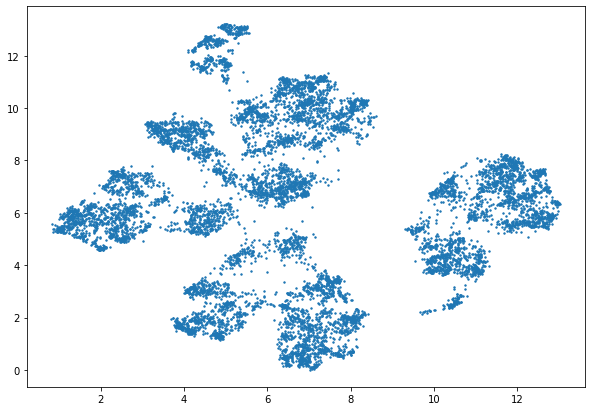

In [8]:
plt.figure(figsize=(10, 7))
plt.scatter(embedding[0][:, 0], embedding[0][:, 1], s=2, cmap='Spectral')
plt.show()

In [7]:
data = pd.concat([numerical, categorical], axis=1)

In [ ]:
data

,age,body_type,drinks,height,status_married,status_seeing someone,status_single,status_unknown,diet_anything,diet_halal,diet_kosher,diet_other,diet_vegan,diet_vegetarian,drugs_never,drugs_often,drugs_sometimes,education_dropped out of high school,education_graduated from college,education_graduated from college/university,education_graduated from grad,education_graduated from high school,education_space camp,education_working on college/university,education_working on grad,education_working on high school,ethnicity_asian,ethnicity_black,ethnicity_hispanic / latin,ethnicity_indian,ethnicity_middle eastern,ethnicity_mixed,ethnicity_native american,ethnicity_white,job_artistic / musical / writer,job_banking / financial / real estate,job_clerical / administrative,job_computer / hardware / software,job_construction / craftsmanship,job_education / academia,...,chinese_no,chinese_yes,english_no,english_yes,german_no,german_yes,hindi_no,hindi_yes,italian_no,italian_yes,japanese_no,japanese_yes,korean_no,korean_yes,portuguese_no,portuguese_yes,russian_no,russian_yes,spanish_no,spanish_yes,turkish_no,turkish_yes,has kids_no,has kids_yes,wants kids_no,wants kids_yes,likes dogs_no,likes dogs_yes,likes cats_no,likes cats_yes,new_religion_Tatheism,new_religion_agnosticism,new_religion_buddhism,new_religion_catholicism,new_religion_christianity,new_religion_hinduism.,new_religion_islam,new_religion_judaism,new_religion_none,new_religion_other
0,0.552803,0.955003,0.183550,-0.332631,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
1,-0.150585,-0.736615,0.183550,-1.606005,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0
2,1.055224,-0.736615,0.183550,-0.332631,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0
3,-0.853974,0.955003,0.183550,0.431394,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0
4,-1.054942,0.109194,0.183550,-0.841980,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.155426,0.109194,-1.187251,-0.841980,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0
9996,-0.452038,0.955003,0.183550,-0.841980,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0
9997,-0.853974,0.109194,0.183550,0.431394,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
9998,0.854255,-2.428233,0.183550,-1.860679,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
num = ['age', 'height']
df_num = df[num]

In [ ]:
from sklearn.preprocessing import PowerTransformer
for c in df_num.columns:
  pt = PowerTransformer()
  df_num.loc[:, c] = pt.fit_transform(np.array(df_num[c]).reshape(-1, 1))

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1781: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


In [ ]:
! pip install umap-learn
import umap
reducer = umap.UMAP()

     |████████████████████████████████| 86 kB 3.3 MB/s 
     |████████████████████████████████| 1.1 MB 62.4 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=998338a71439105702fbafae7c5e40a0dde83f04bb62b97461044f5472eb9a07
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=30c1665c1ab7bf6a545957904edb72d62c075dc2a1c84a05f36ea89905a20165
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


In [ ]:
##preprocessing categorical
# categorical = full_data.select_dtypes(include='object')
categorical = pd.get_dummies(df)

#Percentage of columns which are categorical is used as weight parameter in embeddings later
categorical_weight = len(df.columns) / (df.shape[1] + 2)

#Embedding numerical & categorical
fit1 = umap.UMAP(metric='l2').fit(df_num)
fit2 = umap.UMAP(metric='dice').fit(categorical)

#Augmenting the numerical embedding with categorical
intersection = umap.umap_.general_simplicial_set_intersection(fit1.graph_, fit2.graph_, weight=categorical_weight)
intersection = umap.umap_.reset_local_connectivity(intersection)
embedding = umap.umap_.simplicial_set_embedding(fit1._raw_data, intersection, fit1.n_components,
                                                fit1._initial_alpha, fit1._a, fit1._b,
                                                fit1.repulsion_strength, fit1.negative_sample_rate,
                                                200, 'random', np.random, fit1.metric,
                                                fit1._metric_kwds, False, fit1._densmap_kwds, fit1.output_dens)
#plt.figure(figsize=(20, 10))
#plt.scatter(*embedding.T, s=2, cmap='Spectral', alpha=1.0)
#plt.show()

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
/usr/local/lib/python3.7/dist-packages/umap/umap_.py:1804: UserWarning: gradient function is not yet implemented for dice distance metric; inverse_transform will be unavailable
  "inverse_transform will be unavailable".format(self.metric)


AttributeError: ignored

<Figure size 1440x720 with 0 Axes>

In [ ]:
import umap.umap_ as umap
from matplotlib import pyplot as plt
standard_embedding = umap.UMAP().fit_transform(df)
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], s=0.1, cmap='Spectral');

In [ ]:
df['height'].replace(np.nan,0, inplace = True)
df['body_type'].replace(np.nan,3.5, inplace = True)

In [ ]:
!pip uninstall umap
!pip install umap-learn

     |████████████████████████████████| 86 kB 3.8 MB/s 
     |████████████████████████████████| 1.1 MB 35.1 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=3ca1314403a3dee43cfc7f2630ae2adcb34b69b69439f0ece2839610179eaec9
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=5819df92672c9a88db52cc927d7794517a548e416f981cf4335e3e790e5110bb
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


In [ ]:
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(0,2))
df['age'] = min_max_scaler.fit_transform(df['age'].values.reshape(-1,1))
df['body_type'] = min_max_scaler.fit_transform(df['body_type'].values.reshape(-1,1))
df['drinks'] = min_max_scaler.fit_transform(df['drinks'].values.reshape(-1,1))
df['height'] = min_max_scaler.fit_transform(df['height'].values.reshape(-1,1))
df.drop(labels = 'orientation_bisexual', axis =1 ,  inplace=True)
df.drop(labels = 'orientation_gay', axis =1 ,  inplace=True)
df.drop(labels = 'orientation_straight', axis =1 ,  inplace=True)
df.drop(labels = 'sex_f', axis =1 ,  inplace=True)
df.drop(labels = 'sex_m', axis =1 ,  inplace=True)
df.drop(labels = 'sex_nan', axis =1 ,  inplace=True)
# df_cat = df.drop(columns=['orientation_bisexual', 'orientation_gay', 'orientation_straight', 'sex_f', 'sex_m', 'sex_nan'])

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler


scalar = StandardScaler()

df['height'] = scalar.fit_transform(df['height'].values.reshape(-1,1))
# display(temp.shape)
for x in ['age']:
  df[x] = 2* (df[x] - df[x].min())/ (df[x].max() - df[x].min())
# display(df['height'].isna().count())

# df['height'].replace(np.nan,0, inplace = True)

# df['body_type'].replace(np.nan,3.5, inplace = True)

df['body_type'] = 2*(df['body_type'] - 1)/5 - 1
df['drinks'] = 2*(df['drinks'] )/5 - 1
# df.drop(df.columns[0], axis=1, inplace = True)

# df = df.sample(5000)

In [ ]:
df.drop(df.columns[0], axis=1, inplace = True)

In [ ]:
df.head()

,age,body_type,drinks,height,has kids,wants kids,likes dogs,likes cats,agnosticism,atheism,buddhism,catholicism,christianity,hinduism,islam,judaism,other,arabic,chinese,english,german,hindi,italian,japanese,korean,portuguese,russian,spanish,turkish,status_married,status_seeing someone,status_single,status_unknown,status_nan,sex_f,sex_m,sex_nan,orientation_bisexual,orientation_gay,orientation_straight,...,ethnicity_mixed,ethnicity_native american,ethnicity_white,ethnicity_nan,job_artistic / musical / writer,job_banking / financial / real estate,job_clerical / administrative,job_computer / hardware / software,job_construction / craftsmanship,job_education / academia,job_entertainment / media,job_executive / management,job_hospitality / travel,job_law / legal services,job_medicine / health,job_military,job_other,job_political / government,job_retired,job_sales / marketing / biz dev,job_science / tech / engineering,job_student,job_transportation,job_unemployed,job_nan,location_0.0,location_1.0,location_2.0,location_3.0,location_nan,sign_does_not_matter,sign_matters,sign_whatever,sign_nan,smokes_no,smokes_sometimes,smokes_trying to quit,smokes_when drinking,smokes_yes,smokes_nan
0,38,5,2,67.0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0
1,31,3,2,62.0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
2,43,3,2,67.0,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0
3,24,5,2,70.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0
4,22,4,2,65.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0


In [ ]:
df.drop(labels = 'sex_f', axis =1 ,  inplace=True)
df.drop(labels = 'sex_m', axis =1 ,  inplace=True)
df.drop(labels = 'sex_nan', axis =1 ,  inplace=True)
df.drop(labels = 'orientation_gay', axis =1 ,  inplace=True)
df.drop(labels = 'orientation_bisexual', axis =1 ,  inplace=True)
df.drop(labels = 'orientation_straight', axis =1 ,  inplace=True)

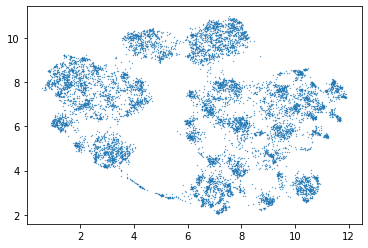

In [ ]:
import umap.umap_ as umap
from matplotlib import pyplot as plt
standard_embedding = umap.UMAP().fit_transform(df)
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], s=0.1, cmap='Spectral');

In [ ]:
df.head()

,Unnamed: 0,age,body_type,drinks,height,arabic,chinese,english,german,hindi,italian,japanese,korean,portuguese,russian,spanish,turkish,has kids,wants kids,likes dogs,likes cats,agnosticism,atheism,buddhism,catholicism,christianity,hinduism,islam,judaism,other,status_married,status_seeing someone,status_single,status_unknown,status_nan,sex_f,sex_m,sex_nan,orientation_bisexual,orientation_gay,...,ethnicity_mixed,ethnicity_native american,ethnicity_white,ethnicity_nan,job_artistic / musical / writer,job_banking / financial / real estate,job_clerical / administrative,job_computer / hardware / software,job_construction / craftsmanship,job_education / academia,job_entertainment / media,job_executive / management,job_hospitality / travel,job_law / legal services,job_medicine / health,job_military,job_other,job_political / government,job_retired,job_sales / marketing / biz dev,job_science / tech / engineering,job_student,job_transportation,job_unemployed,job_nan,location_0.0,location_1.0,location_2.0,location_3.0,location_nan,sign_does_not_matter,sign_matters,sign_whatever,sign_nan,smokes_no,smokes_sometimes,smokes_trying to quit,smokes_when drinking,smokes_yes,smokes_nan
0,0,22,2.0,2,75.0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,1,35,3.0,3,70.0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,2,38,4.0,2,68.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0
3,3,23,4.0,2,71.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0
4,4,29,5.0,2,66.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0


In [ ]:
df_scaled[0]

array([0.        , 0.08695652, 0.4       , 0.8       , 1.57894737,
       0.        , 0.        , 2.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 2.        , 2.        ,
       2.        , 2.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 2.        , 0.        , 0.        ,
       0.        , 2.        , 0.        , 0.        , 0.        ,
       2.        , 0.        , 2.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 2.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 2.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 2.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [ ]:
# Count the number of unique values in the columns we're interested in
# age, education, job

num_age = pd.unique(df['age'])
print(num_age)
num_edu = pd.unique(df['education'])
print(num_edu)
num_job = pd.unique(df['job'])
print(num_job)

In [ ]:
df.head()


,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,last_online,location,offspring,pets,religion,sign,smokes,speaks,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism and very serious about it,gemini,sometimes,english,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,70.0,80000,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism but not too serious about it,cancer,no,"english (fluently), spanish (poorly), french (...",i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,68.0,-1,NaN,2012-06-27-09-10,"san francisco, california",NaN,has cats,NaN,pisces but it doesn&rsquo;t matter,no,"english, french, c++","i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,71.0,20000,student,2012-06-28-14-22,"berkeley, california",doesn't want kids,likes cats,NaN,pisces,no,"english, german (poorly)",i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",66.0,-1,artistic / musical / writer,2012-06-27-21-26,"san francisco, california",NaN,likes dogs and likes cats,NaN,aquarius,no,english,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN


In [ ]:
cols = [col for col in df.columns if 'essay' not in col]
reduced_df = df.filter(cols)

In [ ]:
# offspring
#  convert into 2 columns - has kids, wants kids and null --> 0, 0



In [ ]:
off = pd.get_dummies(reduced_df['offspring'])
off

In [ ]:
# offspring
# convert into 2 columns - has kids, wants kids and null --> 0, 0
off = pd.get_dummies(reduced_df['offspring'])

new = pd.DataFrame(columns=['has kids', 'wants kids'])

# print(off.shape)

for index, row in reduced_df.iterrows():
    has = 0
    wants = 0
    if off["doesn't have kids"][index] == 1 or off["doesn't have kids, and doesn't want any"][index] == 1 or off["doesn't have kids, but might want them"][index] == 1 or off["doesn't have kids, but wants them"][index] == 1:
      has = 1
    if off["doesn't have kids, but might want them"][index] == 1 or off["doesn't have kids, but wants them"][index] == 1 or off["has a kid, and might want more"][index] == 1 or off["has a kid, and wants more"][index] == 1 or off["has kids, and might want more"][index] == 1 or off["has kids, and wants more"][index] == 1 or off["might want kids"][index] == 1 or off["wants kids"][index] == 1:
      wants = 1
    df = df.append({'has kids': has, 'wants kids': wants}, ignore_index=True)

new

In [1]:
df.head()

NameError: ignored

In [ ]:
off = pd.get_dummies(reduced_df['religion'])
off

In [ ]:
# pets

pets = pd.get_dummies(reduced_df['pets'])

new = pd.DataFrame(columns=['likes dogs', 'likes cats'])

for index, row in reduced_df.iterrows():
    dogs = 0
    cats = 0
    if off["has dogs"][index] == 1 or off["has dogs and dislikes cats"][index] == 1 or off["has dogs and has cats"][index] == 1 or off["has dogs and likes cats"][index] == 1 or off["likes dogs"][index] == 1 or off["likes dogs and dislikes cats"][index] == 1 or off["likes dogs and has cats"][index] == 1 or off["likes dogs and likes cats"][index] == 1:
      dogs = 1
    if off["dislikes dogs and has cats"][index] == 1 or off["dislikes dogs and likes cats"][index] == 1 or off["has cats"][index] == 1 or off["has dogs and has cats"][index] == 1 or off["has dogs and likes cats"][index] == 1 or off["likes cats"][index] == 1 or off["likes dogs and has cats"][index] == 1 or off["likes dogs and likes cats"][index] == 1:
      cats = 1
    df = df.append({'likes dogs': dogs, 'likes cats': cats}, ignore_index=True)

new

In [ ]:
# religion

off = pd.get_dummies(reduced_df['religion'])
off

for index, row in reduced_df.iterrows():
    agnosticism = 0
    atheism = 0
    buddhism = 0
    catholicism = 0
    christianity = 0
    islam = 0
    judaism = 0
    other = 0
    if off["agnosticism"][index] == 1 or off["agnosticism and laughing about it"][index] == 1 or off["agnosticism and somewhat serious about it"][index] == 1 or off["agnosticism and very serious about it"][index] == 1 or off["agnosticism but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["atheism"][index] == 1 or off["atheism and laughing about it"][index] == 1 or off["atheism and somewhat serious about it"][index] == 1 or off["atheism and very serious about it"][index] == 1 or off["atheism but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["buddhism"][index] == 1 or off["buddhism and laughing about it"][index] == 1 or off["buddhism and somewhat serious about it"][index] == 1 or off["buddhism and very serious about it"][index] == 1 or off["buddhism but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["catholicism"][index] == 1 or off["catholicism and laughing about it"][index] == 1 or off["catholicism and somewhat serious about it"][index] == 1 or off["catholicism and very serious about it"][index] == 1 or off["catholicism but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["christianity"][index] == 1 or off["christianity and laughing about it"][index] == 1 or off["christianity and somewhat serious about it"][index] == 1 or off["christianity and very serious about it"][index] == 1 or off["christianity but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["islam"][index] == 1 or off["islam and laughing about it"][index] == 1 or off["islam and somewhat serious about it"][index] == 1 or off["islam and very serious about it"][index] == 1 or off["islam but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["judaism"][index] == 1 or off["judaism and laughing about it"][index] == 1 or off["judaism and somewhat serious about it"][index] == 1 or off["judaism and very serious about it"][index] == 1 or off["judaism but not too serious about it"][index] == 1:
      agnosticism = 1
    if off["other"][index] == 1 or off["other and laughing about it"][index] == 1 or off["other and somewhat serious about it"][index] == 1 or off["other and very serious about it"][index] == 1 or off["other but not too serious about it"][index] == 1:
      agnosticism = 1
    
    df = df.append({'agnosticism': agnosticism, 'atheism': atheism, 'buddhism': buddhism, 'catholicism': catholicism, 'christianity': christianity, 'hinduism': hinduism, 'islam': islam, 'judaism': judaism, 'other': other}, ignore_index=True)

new

In [ ]:
new.head()
new.append([0,0])
new.head()

,has kids,wants kids


In [ ]:
reduced_df['offspring'].unique()

array(["doesn't have kids, but might want them", nan, "doesn't want kids",
       "doesn't have kids, but wants them", "doesn't have kids",
       'wants kids', 'has a kid', 'has kids',
       "doesn't have kids, and doesn't want any",
       "has kids, but doesn't want more",
       "has a kid, but doesn't want more", 'has a kid, and wants more',
       'has kids, and might want more', 'might want kids',
       'has a kid, and might want more', 'has kids, and wants more'],
      dtype=object)

In [ ]:
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

columns_to_encode = ["status" ,"sex" ,"orientation" ,"body_type" ,"diet" ,"drinks" ,"drugs" ,"education", "job", "location", "offspring" , "pets", "religion", "sign", "smokes", "speaks"]
columns_to_scale = ["age", "height", "income"]

scaler = MinMaxScaler()
ohe = OneHotEncoder(handle_unknown='ignore', dtype=np.float64)

scaled_columns  = scaler.fit_transform(reduced_df[columns_to_scale]) 
encoded_columns = ohe.fit_transform(reduced_df[columns_to_encode]).toarray()

# Concatenate (Column-Bind) Processed Columns Back Together
processed_data = np.concatenate([scaled_columns, encoded_columns], axis=1)

In [ ]:
test_data = processed_data[:100]

In [ ]:
columns_to_encode = ["status" ,"sex" ,"orientation" ,"body_type" ,"diet" ,"drinks" ,"drugs" ,"education", "job", "location", "offspring" , "pets", "religion", "sign", "smokes", "speaks"]
columns_to_scale = ["age", "height", "income"]

reduced_df['age']=reduced_df['age'].fillna(reduced_df['age'].mode()[0])
reduced_df['height']=reduced_df['height'].fillna(reduced_df['height'].mode()[0])
reduced_df['income']=reduced_df['income'].fillna(reduced_df['income'].mode()[0])
for col in columns_to_encode:
  reduced_df[col]=reduced_df[col].fillna('NotMentioned')

In [ ]:
reduced_df.head()

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# reduced_df = pd.get_dummies(reduced_df)

# reduced_df.head()

enc = OneHotEncoder(handle_unknown='ignore', drop='first', dtype=np.float64)
enc.fit(reduced_df)

one_hot = enc.transform(reduced_df).toarray()

print(one_hot.shape)
print(ec.categories_)

#reduced_df.head()
# data = reduced_df.to_numpy()

# print(data[0])

# clustering = DBSCAN(eps=3, min_samples=2).fit(data)

# clustering.labels_

In [ ]:
for i in one_hot[0]:
  if i != 0:
    print(i)

In [ ]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(one_hot)
X_train_minmax

In [ ]:
# !git clone https://github.com/christopherjenness/DBCV.git

!cd DBCV/DBCV; ls

DBCV.py  __init__.py  __pycache__


In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np
from DBCV.DBCV import DBCV
from scipy.spatial.distance import euclidean

# distances = ['euclidean', 'cosine', 'jaccard', 'canberra']

test_data = df.iloc[:100]

# for dist in distances:
clustering = DBSCAN(eps=4, min_samples=2).fit(test_data)

clustering.labels_

# hdbscan_score = DBCV(df, clustering.labels_, dist_function=euclidean)

In [ ]:
df.iloc[:100]

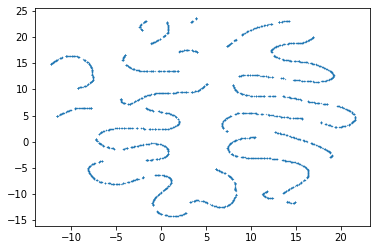

In [ ]:
df_s = df.sample(5000)

import umap.umap_ as umap
from matplotlib import pyplot as plt
standard_embedding = umap.UMAP(random_state=42).fit_transform(df_s)
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], s=0.1, cmap='Spectral');

In [ ]:
# Visualization
import seaborn as sns
from sklearn.decomposition import PCA



# pca = PCA(2) 
# pca_data = pd.DataFrame(pca.fit_transform(test_data),columns=['PC1','PC2'])

# pca_data['cluster'] = pd.Categorical(clustering.labels_)
# sns.scatterplot(x="PC1",y="PC2",hue="cluster",data=pca_data)

# fig,ax = plt.subplots()
# scatter = ax.scatter(pca_data['PC1'], pca_data['PC2'],c=pca_data['cluster'],cmap='Set3',alpha=0.7)
# legend1 = ax.legend(*scatter.legend_elements(),
#                     loc="upper left", title="")
# ax.add_artist(legend1)

# import matplotlib.pyplot as plt

# pca = PCA(2)

# # Turn the dummified df into two columns with PCA
# plot_columns = pca.fit_transform(test_data.reset_index().values.ix[:,0:12])

# # # Plot based on the two dimensions, and shade by cluster label
# # plt.scatter(x=plot_columns[:,1], y=plot_columns[:,0], c=df["clusters"], s=30)
# # plt.show()

# core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
# core_samples_mask[clustering.core_sample_indices_] = True
# labels = clustering.labels_

# # Number of clusters in labels, ignoring noise if present.
# n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
# n_noise_ = list(labels).count(-1)

# # #############################################################################
# # Plot result
# import matplotlib.pyplot as plt

# # Black removed and is used for noise instead.
# unique_labels = set(labels)
# colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
# for k, col in zip(unique_labels, colors):
#     if k == -1:
#         # Black used for noise.
#         col = [0, 0, 0, 1]

#     class_member_mask = labels == k

#     xy = pca_data[class_member_mask & core_samples_mask]
#     plt.plot(
#         xy[:, 0],
#         xy[:, 1],
#         "o",
#         markerfacecolor=tuple(col),
#         markeredgecolor="k",
#         markersize=14,
#     )

#     xy = pca_data[class_member_mask & ~core_samples_mask]
#     plt.plot(
#         xy[:, 0],
#         xy[:, 1],
#         "o",
#         markerfacecolor=tuple(col),
#         markeredgecolor="k",
#         markersize=6,
#     )

# plt.title("Estimated number of clusters: %d" % n_clusters_)
# plt.show()

In [ ]:
def get_val(cat, dog):
  if cat and dog:
    return 'likes cats and dogs'
  elif dog:
    return 'likes dogs'
  elif cat:
    return 'likes cats'
  return 'likes neither'

cats = df['likes cats'].tolist()
dogs = df['likes dogs'].tolist()

new_pets = [get_val(cats[i], dogs[i]) for i in range(len(cats))]

new_pets

In [ ]:
np.set_printoptions(threshold=np.inf)
# clustering.labels_

In [ ]:
pip install kneed

In [ ]:
!pip install kneed

In [12]:
!pip install kneed

3.1393644576089543


<Figure size 360x360 with 0 Axes>

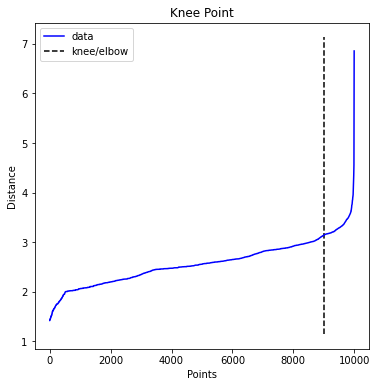

In [16]:
# from sklearn.cluster import DBSCAN
# import numpy as np

# clustering = DBSCAN(eps=0.15, min_samples=2).fit(df)

# clustering.labels_

# parameter tuning for eps
from sklearn.neighbors import NearestNeighbors
nearest_neighbors = NearestNeighbors(n_neighbors=11, metric='euclidean')
neighbors = nearest_neighbors.fit(data)
distances, indices = neighbors.kneighbors(data)
distances = np.sort(distances[:,10], axis=0)

from kneed import KneeLocator
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")
print(distances[knee.knee])

In [ ]:
data

,age,body_type,drinks,height,status_married,status_seeing someone,status_single,status_unknown,diet_anything,diet_halal,diet_kosher,diet_other,diet_vegan,diet_vegetarian,drugs_never,drugs_often,drugs_sometimes,education_dropped out of high school,education_graduated from college,education_graduated from college/university,education_graduated from grad,education_graduated from high school,education_space camp,education_working on college/university,education_working on grad,education_working on high school,ethnicity_asian,ethnicity_black,ethnicity_hispanic / latin,ethnicity_indian,ethnicity_middle eastern,ethnicity_mixed,ethnicity_native american,ethnicity_white,job_artistic / musical / writer,job_banking / financial / real estate,job_clerical / administrative,job_computer / hardware / software,job_construction / craftsmanship,job_education / academia,...,chinese_no,chinese_yes,english_no,english_yes,german_no,german_yes,hindi_no,hindi_yes,italian_no,italian_yes,japanese_no,japanese_yes,korean_no,korean_yes,portuguese_no,portuguese_yes,russian_no,russian_yes,spanish_no,spanish_yes,turkish_no,turkish_yes,has kids_no,has kids_yes,wants kids_no,wants kids_yes,likes dogs_no,likes dogs_yes,likes cats_no,likes cats_yes,new_religion_Tatheism,new_religion_agnosticism,new_religion_buddhism,new_religion_catholicism,new_religion_christianity,new_religion_hinduism.,new_religion_islam,new_religion_judaism,new_religion_none,new_religion_other
0,0.552803,0.955003,0.183550,-0.332631,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
1,-0.150585,-0.736615,0.183550,-1.606005,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0
2,1.055224,-0.736615,0.183550,-0.332631,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0
3,-0.853974,0.955003,0.183550,0.431394,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0
4,-1.054942,0.109194,0.183550,-0.841980,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.155426,0.109194,-1.187251,-0.841980,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0
9996,-0.452038,0.955003,0.183550,-0.841980,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0
9997,-0.853974,0.109194,0.183550,0.431394,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
9998,0.854255,-2.428233,0.183550,-1.860679,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1


In [27]:
from sklearn.cluster import DBSCAN
import numpy as np

clustering = DBSCAN(eps=8, min_samples=2, metric='canberra')
yhat = clustering.fit_predict(data)
print(clustering.labels_)
print(np.unique(yhat))
(unique, counts) = np.unique(yhat, return_counts=True)
frequencies = np.asarray((unique, counts)).T
print(frequencies)


[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0
  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0
  0  0  0  0  0  0  0 -1  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0

In [19]:
np.set_printoptions(threshold=np.inf)
print(yhat)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0 -1 -1  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1 -1  0  0  0  0  0  0
  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  1  0  0  0  0 -1  0  0  0  0  0  0  0  0  0
 -1  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1
  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0

In [63]:
from sklearn.cluster import DBSCAN
import numpy as np
from sklearn.metrics import silhouette_score
#from sklearn.metrics import calinski_harabasz_score
#from sklearn.metrics import davies_bouldin_score

# distancese = {'euclidean': [4.6,4.7,4.8,4.9, 5, 5.1, 5.2, 5.3, 5.4]}

distancese = {'cosine': [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08]}

rese = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
sile = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
clstrse = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
frqe = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
for ms in [2,3,5,10,100]:
  for dist in distancese.keys():
    for d in distancese[dist]:

      clustering = DBSCAN(eps=d, min_samples=ms, metric=dist)

      # clustering.labels_

      yhat = clustering.fit_predict(data)

      clusters = np.unique(yhat)

      (unique, counts) = np.unique(yhat, return_counts=True)
      frequencies = np.asarray((unique, counts)).T

      # Calculate cluster validation metrics
      try:
        score_dbsacn_s = silhouette_score(data, yhat, metric=dist)
        print('Silhouette Score: %.4f' % score_dbsacn_s)
      except:
        score_dbsacn_s = -1

      rese[dist].append(clustering)
      sile[dist].append(score_dbsacn_s)
      clstrse[dist].append(clusters.size)
      frqe[dist].append(frequencies)

Silhouette Score: -0.5401
Silhouette Score: -0.5580
Silhouette Score: -0.5561
Silhouette Score: -0.5269
Silhouette Score: -0.5083
Silhouette Score: -0.4972
Silhouette Score: -0.5004
Silhouette Score: -0.4681
Silhouette Score: -0.4614
Silhouette Score: -0.5001
Silhouette Score: -0.5192
Silhouette Score: -0.5282
Silhouette Score: -0.5093
Silhouette Score: -0.4854
Silhouette Score: -0.4635
Silhouette Score: -0.4013
Silhouette Score: -0.3118
Silhouette Score: -0.3725
Silhouette Score: -0.4324
Silhouette Score: -0.4536
Silhouette Score: -0.4596
Silhouette Score: -0.4288
Silhouette Score: -0.3992
Silhouette Score: -0.2867
Silhouette Score: -0.3439
Silhouette Score: -0.3353
Silhouette Score: -0.1070
Silhouette Score: -0.1661
Silhouette Score: -0.0960
Silhouette Score: -0.1384


In [65]:
print((frqe['cosine']))

[array([[  -1, 9791],
       [   0,    2],
       [   1,    9],
       [   2,    2],
       [   3,    3],
       [   4,    2],
       [   5,    3],
       [   6,    2],
       [   7,    3],
       [   8,    2],
       [   9,    2],
       [  10,    2],
       [  11,    2],
       [  12,    2],
       [  13,    2],
       [  14,    5],
       [  15,    2],
       [  16,    2],
       [  17,    2],
       [  18,    3],
       [  19,    2],
       [  20,    2],
       [  21,    2],
       [  22,    2],
       [  23,    2],
       [  24,    2],
       [  25,    2],
       [  26,    2],
       [  27,    2],
       [  28,    2],
       [  29,    2],
       [  30,    2],
       [  31,    2],
       [  32,    2],
       [  33,    2],
       [  34,    2],
       [  35,    2],
       [  36,    2],
       [  37,    2],
       [  38,    2],
       [  39,    4],
       [  40,    2],
       [  41,    2],
       [  42,    2],
       [  43,    2],
       [  44,    2],
       [  45,    3],
       [  46

In [29]:
from sklearn.cluster import DBSCAN
import numpy as np
from sklearn.metrics import silhouette_score
#from sklearn.metrics import calinski_harabasz_score
#from sklearn.metrics import davies_bouldin_score

distances = {'euclidean': [1, 1.5, 2, 2.5, 3, 3.1393644576089543, 3.5, 4, 4.5, 5, 5.5, 6, 6.5],
             'cosine': [0.05, 0.10, 0.1528360940787249, 0.20, 0.25, 0.26, 0.27, 0.28, 0.29, 0.30, 0.5],
             'jaccard': [0.05, 0.01, 0.15, 0.18181818181818182, 0.25, 0.26, 0.27, 0.28, 0.29, 0.35],
             'canberra': [6, 8.0, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]}

res = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
sil = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
clstrs = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
frq = {'euclidean': [],
             'cosine': [],
             'jaccard': [],
             'canberra': []}
for ms in [2,3,5,10,100]:
  for dist in distances.keys():
    for d in distances[dist]:

      clustering = DBSCAN(eps=d, min_samples=ms, metric=dist)

      # clustering.labels_

      yhat = clustering.fit_predict(data)

      clusters = np.unique(yhat)

      (unique, counts) = np.unique(yhat, return_counts=True)
      frequencies = np.asarray((unique, counts)).T

      # Calculate cluster validation metrics
      try:
        score_dbsacn_s = silhouette_score(data, yhat, metric=dist)
        print('Silhouette Score: %.4f' % score_dbsacn_s)
      except:
        score_dbsacn_s = -1

      res[dist].append(clustering)
      sil[dist].append(score_dbsacn_s)
      clstrs[dist].append(clusters.size)
      frq[dist].append(frequencies)


Silhouette Score: -0.3478
Silhouette Score: -0.3397
Silhouette Score: -0.3068
Silhouette Score: -0.2002
Silhouette Score: 0.0089
Silhouette Score: 0.1045
Silhouette Score: 0.2768
Silhouette Score: 0.4077
Silhouette Score: 0.4323
Silhouette Score: 0.4595
Silhouette Score: -0.5083
Silhouette Score: -0.4116
Silhouette Score: 0.0291
Silhouette Score: 0.2679
Silhouette Score: 0.4257


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.3118


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.3118


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.1561


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1678


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2885


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.2196
Silhouette Score: 0.0817
Silhouette Score: 0.2792
Silhouette Score: 0.3071
Silhouette Score: 0.3190
Silhouette Score: 0.3245
Silhouette Score: 0.3301
Silhouette Score: -0.2997
Silhouette Score: -0.3197
Silhouette Score: -0.2813
Silhouette Score: -0.1115
Silhouette Score: 0.0784
Silhouette Score: 0.1846
Silhouette Score: 0.3055
Silhouette Score: 0.4077
Silhouette Score: 0.4323
Silhouette Score: 0.4595
Silhouette Score: -0.5093
Silhouette Score: -0.2391
Silhouette Score: 0.2052
Silhouette Score: 0.2679
Silhouette Score: 0.4257


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.4364


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.4364


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.0910


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2278


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2704


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2885


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.0268
Silhouette Score: 0.2243
Silhouette Score: 0.2792
Silhouette Score: 0.3071
Silhouette Score: 0.3190
Silhouette Score: 0.3245
Silhouette Score: 0.3301
Silhouette Score: -0.1946
Silhouette Score: -0.2685
Silhouette Score: -0.2428
Silhouette Score: 0.0807
Silhouette Score: 0.1756
Silhouette Score: 0.1954
Silhouette Score: 0.3055
Silhouette Score: 0.4077
Silhouette Score: 0.4471
Silhouette Score: 0.4595
Silhouette Score: -0.4596
Silhouette Score: 0.0932
Silhouette Score: 0.2067
Silhouette Score: 0.2843
Silhouette Score: 0.4257


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.4527


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.4527


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1685


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2277


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2885


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1473
Silhouette Score: 0.2237
Silhouette Score: 0.2792
Silhouette Score: 0.3065
Silhouette Score: 0.3190
Silhouette Score: 0.3245
Silhouette Score: 0.3301
Silhouette Score: -0.1817
Silhouette Score: -0.0510
Silhouette Score: 0.0741
Silhouette Score: 0.1741
Silhouette Score: 0.1960
Silhouette Score: 0.3035
Silhouette Score: 0.4040
Silhouette Score: 0.4471
Silhouette Score: 0.4595
Silhouette Score: -0.3353
Silhouette Score: 0.0830
Silhouette Score: 0.2109
Silhouette Score: 0.2843
Silhouette Score: 0.4257


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.3562


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: -0.3562


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1640


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2262


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2885


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1393
Silhouette Score: 0.2230
Silhouette Score: 0.2792
Silhouette Score: 0.3065
Silhouette Score: 0.3190
Silhouette Score: 0.3245
Silhouette Score: 0.3301
Silhouette Score: 0.0086
Silhouette Score: 0.1470
Silhouette Score: 0.1710
Silhouette Score: 0.2844
Silhouette Score: 0.3771
Silhouette Score: 0.4471
Silhouette Score: 0.4664
Silhouette Score: -0.0530
Silhouette Score: 0.1874
Silhouette Score: 0.3000
Silhouette Score: 0.4257


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.1137


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2124


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2719


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2719


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2719


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2719


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.2885


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Silhouette Score: 0.0625
Silhouette Score: 0.1961
Silhouette Score: 0.2735
Silhouette Score: 0.2998
Silhouette Score: 0.3178
Silhouette Score: 0.3245
Silhouette Score: 0.3301


In [31]:
print(sil)

{'euclidean': [-0.3478348376964991, -0.3396682726564397, -0.30679188575751376, -0.20019025024002154, 0.008862626862166247, 0.10446330470054986, 0.2767612372016223, 0.4077118711543758, 0.4323424459433835, 0.45949993119958993, -1, -1, -1, -0.2996832977833667, -0.3196863152811751, -0.28128935383890524, -0.11152392275283626, 0.0784177333191169, 0.18459883234108465, 0.30554777342916584, 0.4077118711543758, 0.4323424459433835, 0.45949993119958993, -1, -1, -1, -0.19462610514346695, -0.26853077024772487, -0.24276821217634514, 0.08070745173973455, 0.17559849669437794, 0.19544850936296598, 0.30554777342916584, 0.4077118711543758, 0.4471089961413433, 0.45949993119958993, -1, -1, -1, -1, -0.18170313843988933, -0.051038938136962975, 0.07410613680501271, 0.1740570261726625, 0.19599059450020037, 0.3034715072594699, 0.4039717772894379, 0.4471089961413433, 0.45949993119958993, -1, -1, -1, -1, -1, -1, 0.008636494421727706, 0.14697144890980485, 0.1710413358172243, 0.28437359417569863, 0.37709428325968736

In [47]:
print(frq['euclidean'][0])

[[  -1 9639]
 [   0    4]
 [   1    2]
 [   2   10]
 [   3    2]
 [   4    2]
 [   5    2]
 [   6    8]
 [   7    4]
 [   8    2]
 [   9    2]
 [  10    4]
 [  11    2]
 [  12    2]
 [  13    2]
 [  14    2]
 [  15    4]
 [  16    2]
 [  17    2]
 [  18    2]
 [  19    2]
 [  20    2]
 [  21    2]
 [  22    2]
 [  23    2]
 [  24    5]
 [  25    2]
 [  26    2]
 [  27    3]
 [  28    2]
 [  29    2]
 [  30    2]
 [  31    2]
 [  32    3]
 [  33    4]
 [  34    2]
 [  35    5]
 [  36    2]
 [  37    2]
 [  38    2]
 [  39    2]
 [  40    2]
 [  41    3]
 [  42    3]
 [  43    2]
 [  44    2]
 [  45    2]
 [  46    2]
 [  47    2]
 [  48    3]
 [  49    2]
 [  50    2]
 [  51    2]
 [  52    2]
 [  53    2]
 [  54    2]
 [  55    2]
 [  56    2]
 [  57    2]
 [  58    2]
 [  59    2]
 [  60    2]
 [  61    2]
 [  62    2]
 [  63    4]
 [  64    2]
 [  65    2]
 [  66    2]
 [  67    2]
 [  68    2]
 [  69    2]
 [  70    2]
 [  71    2]
 [  72    3]
 [  73    2]
 [  74    3]
 [  75    2]

In [46]:
# print(frq['cosine'])
for dist in frq.keys():
  print(dist)
  j = 0
  for u in frq[dist]:
    print("-")
    sum = 0
    sum += u[0][1]
    if sum > 9000:
      print("omg: ", dist)
      print(j)
    j += 1
    print("-")

euclidean
-
omg:  euclidean
0
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
omg:  euclidean
10
-
-
omg:  euclidean
11
-
-
omg:  euclidean
12
-
-
omg:  euclidean
13
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
omg:  euclidean
23
-
-
omg:  euclidean
24
-
-
omg:  euclidean
25
-
-
omg:  euclidean
26
-
-
omg:  euclidean
27
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
omg:  euclidean
36
-
-
omg:  euclidean
37
-
-
omg:  euclidean
38
-
-
omg:  euclidean
39
-
-
omg:  euclidean
40
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
omg:  euclidean
49
-
-
omg:  euclidean
50
-
-
omg:  euclidean
51
-
-
omg:  euclidean
52
-
-
omg:  euclidean
53
-
-
omg:  euclidean
54
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
-
omg:  euclidean
62
-
-
omg:  euclidean
63
-
-
omg:  euclidean
64
-
cosine
-
-
-
-
-
-
-
-
-
-
-
omg:  cosine
5
-
-
omg:  cosine
6
-
-
omg:  cosine
7
-
-
omg:  cosine
8
-
-
omg:  cosine
9
-
-
omg:  cosine
10
-
-
-
-
-
-
-
-
-
-
-
-
omg:  cosine
16
-
-
omg:  cosine
17
-
-
omg:  cosine
18
-
-
omg:  cosine
19
-
-
omg:  cosine
20
-
-
omg:  cosin

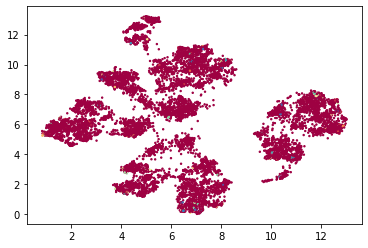

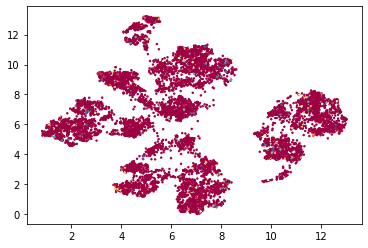

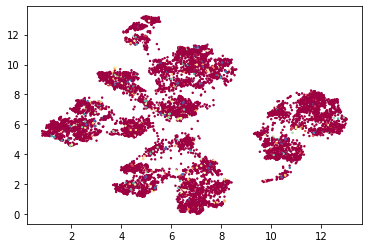

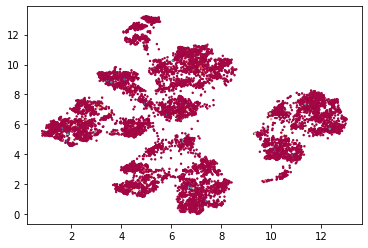

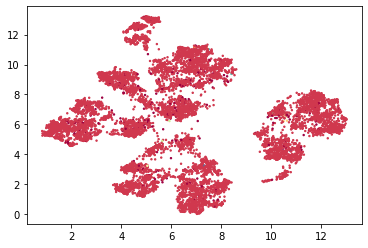

...

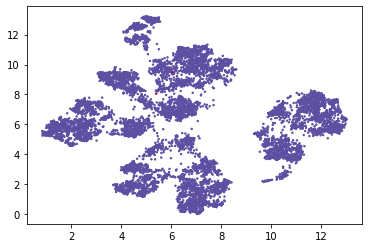

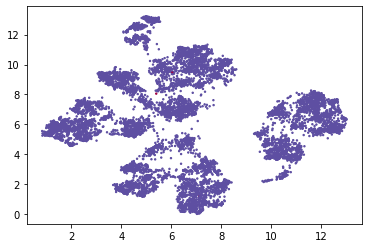

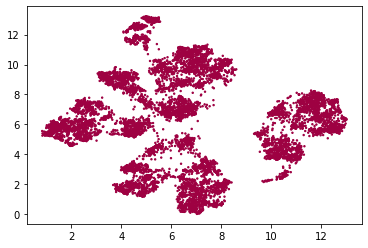

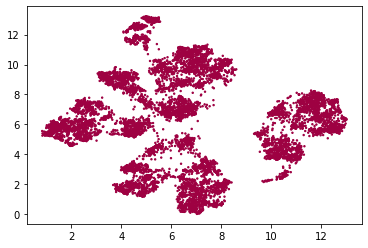

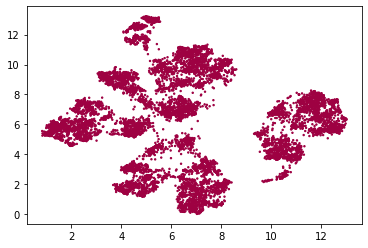

In [48]:
# plt.scatter(embedding[:, 0], embedding[:, 1], c=clustering.labels_, s=0.8);
for dist in distances:
  for clust in res['euclidean']:
    plt.figure()
    plt.scatter(embedding[0][:, 0], embedding[0][:, 1], c=clust.labels_, s=2, cmap='Spectral');
    plt.show()

In [ ]:
from sklearn.cluster import DBSCAN
from scipy.spatial import distance
import numpy as np

clustering = DBSCAN(eps=0.12, min_samples=2, metric='jaccard').fit(df)

clustering.labels_

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:1870: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


array([  0,  -1,  -1,   0,   0,   0,   0,  -1,  -1,  -1,  -1,   0,   0,
         0,   1,   0,  -1,   0,   0,  -1,   2,   0,   0,   0,   0,   3,
         0,  -1,  -1,   0,  -1,  -1,   0,   0,   0,   0,  -1,   0,  -1,
         0,   0,   4,  -1,   5,   0,   0,   0,   0,   0,   6,  -1,  -1,
         0,  -1,  -1,   0,   0,   0,   0,  -1,  -1,   7,   0,   8,  -1,
        -1,   0,   0,   0,  -1,   0,   9,  -1,  -1,   0,   0,   0,  -1,
         0,   0,  -1,   0,   0,   0,   0,   0,   0,   0,  -1,  -1,   0,
         0,  10,   0,  11,  -1,   0,   0,   0,  -1,   0,  -1,   0,  -1,
        -1,  -1,   0,  -1,   0,  12,   0,   0,   0,   0,   0,   0,   0,
        13,   0,  -1,  14,   0,   0,  -1,   0,   0,   0,   0,  -1,   0,
         0,  -1,  -1,   0,   0,  -1,   0,   0,  -1,   0,   0,  -1,   0,
        -1,   0,  -1,   0,  -1,   0,   0,  15,   0,   0,   0,  -1,   0,
         0,   0,  -1,   0,   0,   0,  -1,  16,  -1,   0,   0,  -1,   0,
        -1,  -1,   0,  17,   0,   0,   0,   0,   0,  18,   0,   

In [ ]:
from sklearn.cluster import DBSCAN
from scipy.spatial import distance
import numpy as np

clustering = DBSCAN(eps=3.5, min_samples=2, metric='canberra').fit(df)

clustering.labels_

array([  0,  -1,  -1,   0,   0,   0,   1,  -1,  -1,  -1,   0,   0,   0,
         0,   0,   0,  -1,   0,   0,  -1,  -1,   2,   0,   0,  -1,   3,
         0,  -1,  -1,   0,  -1,  -1,   0,   0,   0,   0,  -1,   0,  -1,
         0,   0,   0,  -1,  -1,   0,   0,   0,   0,   0,   4,  -1,   0,
         0,  -1,  -1,   0,   0,   0,   0,  -1,  -1,   0,   0,  -1,  -1,
         0,   0,   0,   0,  -1,   0,   0,  -1,  -1,   0,   0,  -1,  -1,
         0,   0,   0,   0,   0,   0,   0,   0,  -1,   0,  -1,  -1,   0,
         0,   0,   0,   0,  -1,   0,   0,  -1,  -1,  -1,  -1,   0,  -1,
        -1,  -1,   0,  -1,   0,   0,  -1,   0,   0,   0,   0,  -1,   0,
         0,   0,   0,   0,   0,  -1,  -1,   0,   0,   0,   0,  -1,   0,
         0,  -1,  -1,   0,  -1,  -1,   0,   0,  -1,   0,   0,   5,   0,
         0,   0,  -1,   0,  -1,   0,   0,   6,   0,   0,   0,  -1,   0,
         0,  -1,  -1,   0,   0,   7,  -1,  -1,  -1,  -1,  -1,  -1,   0,
        -1,  -1,  -1,   8,   0,   0,   0,  -1,   0,  -1,   0,   

In [ ]:
reduced_df = df.filter(['age','education','job'])

# Replace all missing values with their respective modes
reduced_df['age']=reduced_df['age'].fillna(reduced_df['age'].mode()[0])
reduced_df['education']=reduced_df['education'].fillna(reduced_df['education'].mode()[0])
reduced_df['job']=reduced_df['job'].fillna(reduced_df['job'].mode()[0])

display(reduced_df)
data = reduced_df.to_numpy()
print(data.shape)

# k = 4
kproto = KPrototypes(n_clusters=4, init='Cao', verbose=2)
clusters = kproto.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto.cluster_centroids_)
# Print training statistics
print(kproto.cost_)
print(kproto.n_iter_)

In [ ]:
# Take a look at the clusters
print(clusters)
print(clusters.shape)

[0 1 3 ... 3 0 3]
(59946,)


In [ ]:
# k = 2
kproto2 = KPrototypes(n_clusters=2, init='Cao', verbose=2)
clusters2 = kproto2.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto2.cluster_centroids_)
# Print training statistics
print(kproto2.cost_)
print(kproto2.n_iter_)

In [ ]:
# k = 5
kproto5 = KPrototypes(n_clusters=5, init='Cao', verbose=2)
clusters5 = kproto5.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto5.cluster_centroids_)
# Print training statistics
print(kproto5.cost_)
print(kproto5.n_iter_)

In [ ]:
# k = 6
kproto6 = KPrototypes(n_clusters=6, init='Cao', verbose=2)
clusters6 = kproto6.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto6.cluster_centroids_)
# Print training statistics
print(kproto6.cost_)
print(kproto6.n_iter_)

In [ ]:
# k = 8
kproto8 = KPrototypes(n_clusters=8, init='Cao', verbose=2)
clusters8 = kproto8.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto8.cluster_centroids_)
# Print training statistics
print(kproto8.cost_)
print(kproto8.n_iter_)

In [ ]:
# k = 10
kproto10 = KPrototypes(n_clusters=10, init='Cao', verbose=2)
clusters10 = kproto10.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto10.cluster_centroids_)
# Print training statistics
print(kproto10.cost_)
print(kproto10.n_iter_)

In [ ]:
# k = 12
kproto12 = KPrototypes(n_clusters=12, init='Cao', verbose=2)
clusters12 = kproto12.fit_predict(data, categorical=[1, 2])

# Print cluster centroids of the trained model.
print(kproto12.cluster_centroids_)
# Print training statistics
print(kproto12.cost_)
print(kproto12.n_iter_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 13300, ncost: 507398.6489682282
Run: 1, iteration: 2/100, moves: 4229, ncost: 465651.8007645482
Run: 1, iteration: 3/100, moves: 2160, ncost: 450010.3639611008
Run: 1, iteration: 4/100, moves: 2564, ncost: 442401.69874246017
Run: 1, iteration: 5/100, moves: 725, ncost: 438730.4080909116
Run: 1, iteration: 6/100, moves: 34, ncost: 438706.2468181514
Run: 1, iteration: 7/100, moves: 0, ncost: 438706.2468181514
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 10710, ncost: 468724.9497583647
Run: 2, iteration: 2/100, moves: 2609, ncost: 445179.57207840064
Run: 2, iteration: 3/100, moves: 1701, ncost: 435546.0942423732
Run: 2, iteration: 4/100, moves: 1393, ncost: 426906.35673190013
Run: 2, iteration: 5/100, moves: 1012, ncost: 425011.7918941589
Run: 2, iteratio

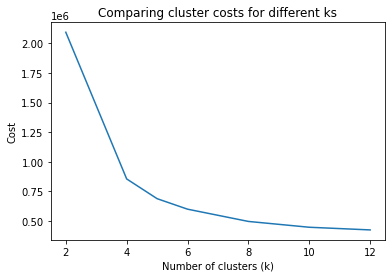

In [ ]:
# Plot the costs
ks = [2, 4, 5, 6, 8, 10, 12]
costs = [kproto2.cost_, kproto.cost_, kproto5.cost_, kproto6.cost_, kproto8.cost_, kproto10.cost_, kproto12.cost_]
plt.plot(ks, costs)
plt.title('Comparing cluster costs for different ks')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Cost')
plt.show()